# Churn Rate Analysis

This notebook analyzes customer churn using machine learning techniques.

## 1. Introduction

Customer churn is a critical metric for businesses. In this notebook, we will:
- Load and clean the dataset
- Perform exploratory data analysis (EDA)
- Train machine learning models
- Evaluate model performance

## 2. Data Loading and Cleaning

We start by loading the dataset and handling missing values or incorrect data types.

In [1]:
import pandas as pd
import numpy as np
import pandas as pd
import pycaret
from pycaret.classification import *
from functools import reduce
from datetime import datetime
import plotly.offline as pyo
import plotly.graph_objs as go
from sklearn.model_selection import train_test_split
from ydata_profiling import ProfileReport
from sklearn.preprocessing import OrdinalEncoder
import matplotlib.pyplot as plt
import seaborn as sns
import requests
from scipy import stats
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.svm import LinearSVC, SVC
from xgboost import XGBClassifier
from sklearn.naive_bayes import GaussianNB
import numpy as np
import pickle
import mlflow
import mlflow.sklearn
import plotly.graph_objects as go

from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import (
    confusion_matrix, accuracy_score, precision_score, 
    recall_score, f1_score, roc_curve, auc
)
import plotly.express as px
from sklearn.svm import LinearSVC, SVC




### Loading Datasets

In [2]:
clientes_dic=pd.read_csv(r"C:\Users\alros\Documents\Master UCM Modulos Documentacion\8. Machine Learning\Semana 3 y 4\2.ejercicio_churn\diciembre\clientes_diciembre.csv", sep='|')
productos_dic = pd.read_csv(r"C:\Users\alros\Documents\Master UCM Modulos Documentacion\8. Machine Learning\Semana 3 y 4\2.ejercicio_churn\diciembre\productos_diciembre.csv", sep= '|')
consumos_dic= pd.read_csv(r"C:\Users\alros\Documents\Master UCM Modulos Documentacion\8. Machine Learning\Semana 3 y 4\2.ejercicio_churn\diciembre\consumos_diciembre.csv", sep='|')
finan_dic = pd.read_csv(r"C:\Users\alros\Documents\Master UCM Modulos Documentacion\8. Machine Learning\Semana 3 y 4\2.ejercicio_churn\diciembre\financiacion_diciembre.csv", sep= '|')


In [3]:
dfs = [clientes_dic,consumos_dic,finan_dic,productos_dic]
df_dic = reduce(lambda left, right: pd.merge(left, right, on='id', how='outer'), dfs)
df_dic

,id,edad,facturacion,antiguedad,provincia,num_lineas,num_dt,incidencia,num_llamad_ent,num_llamad_sal,mb_datos,seg_llamad_ent,seg_llamad_sal,financiacion,imp_financ,descuentos,conexion,vel_conexion,TV
0,1,63,216.028109,2018-11-23 08:48:00,La Rioja,5,NaN,NaN,110,79,10897,12806,13751,NaN,NaN,NaN,FIBRA,50MB,tv-futbol
1,2,84,255.830842,2017-08-22 03:19:00,Vizcaya,3,NaN,NaN,189,89,18657,6499,10862,NaN,NaN,SI,FIBRA,600MB,tv-futbol
2,3,66,135.768153,2001-12-27 13:50:00,Albacete,4,NaN,NaN,129,30,15511,17013,16743,NaN,NaN,SI,ADSL,35MB,tv-futbol
3,4,69,255.658527,2015-08-08 10:53:00,Lugo,4,NaN,NaN,51,52,12670,3393,6771,NaN,NaN,NaN,FIBRA,200MB,tv-familiar
4,5,30,22.302845,1997-08-29 02:19:00,Tarragona,2,2.0,NaN,183,3,23756,18436,4485,NaN,NaN,NaN,ADSL,10MB,tv-futbol
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95462,99995,65,173.741667,2019-03-05 00:00:00,Murcia,5,NaN,NaN,121,98,13403,6197,6853,SI,23.138779,NaN,ADSL,35MB,tv-familiar
95463,99996,36,215.890326,2013-04-09 13:33:00,Guadalajara,3,NaN,NaN,98,13,5291,3684,1667,NaN,NaN,NaN,ADSL,30MB,tv-futbol
95464,99997,68,285.890750,2003-08-08 23:57:00,Asturias,5,NaN,NaN,226,20,20002,572,5679,SI,14.616422,NaN,FIBRA,200MB,tv-futbol
95465,99998,20,383.167610,2013-03-27 20:07:00,Álava,4,NaN,NaN,126,26,16448,833,14398,NaN,NaN,NaN,ADSL,20MB,tv-futbol


In [4]:
clientes_ene=pd.read_csv(r"C:\Users\alros\Documents\Master UCM Modulos Documentacion\8. Machine Learning\Semana 3 y 4\2.ejercicio_churn\enero\clientes_enero.csv", sep='|')
productos_ene = pd.read_csv(r"C:\Users\alros\Documents\Master UCM Modulos Documentacion\8. Machine Learning\Semana 3 y 4\2.ejercicio_churn\enero\consumos_enero.csv", sep= '|')
consumos_ene= pd.read_csv(r'C:\Users\alros\Documents\Master UCM Modulos Documentacion\8. Machine Learning\Semana 3 y 4\2.ejercicio_churn\enero\financiacion_enero.csv', sep='|')
finan_ene = pd.read_csv(r"C:\Users\alros\Documents\Master UCM Modulos Documentacion\8. Machine Learning\Semana 3 y 4\2.ejercicio_churn\enero\productos_enero.csv", sep= '|')


In [5]:
dfs = [clientes_ene,consumos_ene,finan_ene,productos_ene]
df_ene = reduce(lambda left, right: pd.merge(left, right, on='id', how='outer'), dfs)
df_ene

,id,edad,facturacion,antiguedad,provincia,num_lineas,num_dt,incidencia,financiacion,imp_financ,descuentos,conexion,vel_conexion,TV,num_llamad_ent,num_llamad_sal,mb_datos,seg_llamad_ent,seg_llamad_sal
0,1,63,216.028109,11/23/2018 08:48 AM,La Rioja,5,NaN,NaN,NaN,NaN,NaN,FIBRA,50MB,tv-futbol,95,19,6525,7634,18520
1,2,84,255.830842,08/22/2017 03:19 AM,Vizcaya,3,NaN,NaN,NaN,NaN,SI,FIBRA,600MB,tv-futbol,44,36,14471,14541,8016
2,3,66,135.768153,12/27/2001 01:50 PM,Albacete,4,NaN,NaN,NaN,NaN,SI,ADSL,35MB,tv-futbol,94,27,1428,5248,7106
3,4,69,255.658527,08/08/2015 10:53 AM,Lugo,4,NaN,NaN,NaN,NaN,NaN,FIBRA,200MB,tv-familiar,186,20,20083,7372,5052
4,6,51,99.348645,11/04/1997 11:43 AM,Huelva,4,NaN,NaN,NaN,NaN,NaN,FIBRA,200MB,tv-futbol,37,32,19078,5009,8686
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
92706,99996,36,215.890326,04/09/2013 01:33 PM,Guadalajara,3,NaN,NaN,NaN,NaN,NaN,ADSL,30MB,tv-futbol,217,96,9059,7735,8823
92707,99997,68,285.890750,08/08/2003 11:57 PM,Asturias,5,NaN,NaN,SI,14.616422,NaN,FIBRA,200MB,tv-futbol,168,99,9303,4798,3996
92708,99998,20,383.167610,03/27/2013 08:07 PM,Álava,4,NaN,NaN,NaN,NaN,NaN,ADSL,20MB,tv-futbol,188,71,19018,1237,16720
92709,99999,53,53.301395,01/18/2020 02:30 AM,Sevilla,2,NaN,NaN,NaN,NaN,NaN,FIBRA,50MB,tv-futbol,138,40,20264,10552,17637


In [6]:
df_ene['mes'] = 'jan'
df_dic['mes'] = 'dec'

In [7]:
df_dic.head()

,id,edad,facturacion,antiguedad,provincia,num_lineas,num_dt,incidencia,num_llamad_ent,num_llamad_sal,mb_datos,seg_llamad_ent,seg_llamad_sal,financiacion,imp_financ,descuentos,conexion,vel_conexion,TV,mes
0,1,63,216.028109,2018-11-23 08:48:00,La Rioja,5,NaN,NaN,110,79,10897,12806,13751,NaN,NaN,NaN,FIBRA,50MB,tv-futbol,dec
1,2,84,255.830842,2017-08-22 03:19:00,Vizcaya,3,NaN,NaN,189,89,18657,6499,10862,NaN,NaN,SI,FIBRA,600MB,tv-futbol,dec
2,3,66,135.768153,2001-12-27 13:50:00,Albacete,4,NaN,NaN,129,30,15511,17013,16743,NaN,NaN,SI,ADSL,35MB,tv-futbol,dec
3,4,69,255.658527,2015-08-08 10:53:00,Lugo,4,NaN,NaN,51,52,12670,3393,6771,NaN,NaN,NaN,FIBRA,200MB,tv-familiar,dec
4,5,30,22.302845,1997-08-29 02:19:00,Tarragona,2,2.0,NaN,183,3,23756,18436,4485,NaN,NaN,NaN,ADSL,10MB,tv-futbol,dec


In [8]:
df_ene.head()

,id,edad,facturacion,antiguedad,provincia,num_lineas,num_dt,incidencia,financiacion,imp_financ,descuentos,conexion,vel_conexion,TV,num_llamad_ent,num_llamad_sal,mb_datos,seg_llamad_ent,seg_llamad_sal,mes
0,1,63,216.028109,11/23/2018 08:48 AM,La Rioja,5,NaN,NaN,NaN,NaN,NaN,FIBRA,50MB,tv-futbol,95,19,6525,7634,18520,jan
1,2,84,255.830842,08/22/2017 03:19 AM,Vizcaya,3,NaN,NaN,NaN,NaN,SI,FIBRA,600MB,tv-futbol,44,36,14471,14541,8016,jan
2,3,66,135.768153,12/27/2001 01:50 PM,Albacete,4,NaN,NaN,NaN,NaN,SI,ADSL,35MB,tv-futbol,94,27,1428,5248,7106,jan
3,4,69,255.658527,08/08/2015 10:53 AM,Lugo,4,NaN,NaN,NaN,NaN,NaN,FIBRA,200MB,tv-familiar,186,20,20083,7372,5052,jan
4,6,51,99.348645,11/04/1997 11:43 AM,Huelva,4,NaN,NaN,NaN,NaN,NaN,FIBRA,200MB,tv-futbol,37,32,19078,5009,8686,jan


In [9]:
print('Enero: ',len(df_ene['id'].unique()))
print('Diciembre: ',len(df_dic['id'].unique()))

Enero:  92711
Diciembre:  95467


## 4. Creating Target Variable: Churn
### Computing Churn time from Antiquity Dates

In [10]:
churn = pd.DataFrame()
churn['churn'] = np.where(df_dic.id.isin(df_ene.id) == True, 0, 1)
churn['id'] =df_dic['id']

In [11]:
df_dic["antiguedad"] = pd.to_datetime(df_dic["antiguedad"])
df_ene["antiguedad"] = pd.to_datetime(df_ene["antiguedad"])


df_dic['duracion'] = (datetime(2019,12,31) - df_dic["antiguedad"])
df_ene['duracion'] = (datetime(2020,1,31) - df_ene["antiguedad"])

## 6. Results & Conclusion

We analyze the performance of our models and summarize key insights.

## 3. Exploratory Data Analysis (EDA)

Here, we explore the dataset with visualizations and statistical summaries to understand patterns.

In [12]:
df_ene.info(), df_dic.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 92711 entries, 0 to 92710
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype          
---  ------          --------------  -----          
 0   id              92711 non-null  int64          
 1   edad            92711 non-null  int64          
 2   facturacion     92711 non-null  float64        
 3   antiguedad      92711 non-null  datetime64[ns] 
 4   provincia       92711 non-null  object         
 5   num_lineas      92711 non-null  int64          
 6   num_dt          2614 non-null   float64        
 7   incidencia      1991 non-null   object         
 8   financiacion    6666 non-null   object         
 9   imp_financ      6666 non-null   float64        
 10  descuentos      20038 non-null  object         
 11  conexion        92709 non-null  object         
 12  vel_conexion    92708 non-null  object         
 13  TV              92711 non-null  object         
 14  num_llamad_ent  92711 non-null  int64 

(None, None)

In [13]:
data = pd.concat([df_dic, df_ene], sort = False, ignore_index=True)
data.columns= data.columns.str.lower()
data.head()

,id,edad,facturacion,antiguedad,provincia,num_lineas,num_dt,incidencia,num_llamad_ent,num_llamad_sal,...,seg_llamad_ent,seg_llamad_sal,financiacion,imp_financ,descuentos,conexion,vel_conexion,tv,mes,duracion
0,1,63,216.028109,2018-11-23 08:48:00,La Rioja,5,NaN,NaN,110,79,...,12806,13751,NaN,NaN,NaN,FIBRA,50MB,tv-futbol,dec,402 days 15:12:00
1,2,84,255.830842,2017-08-22 03:19:00,Vizcaya,3,NaN,NaN,189,89,...,6499,10862,NaN,NaN,SI,FIBRA,600MB,tv-futbol,dec,860 days 20:41:00
2,3,66,135.768153,2001-12-27 13:50:00,Albacete,4,NaN,NaN,129,30,...,17013,16743,NaN,NaN,SI,ADSL,35MB,tv-futbol,dec,6577 days 10:10:00
3,4,69,255.658527,2015-08-08 10:53:00,Lugo,4,NaN,NaN,51,52,...,3393,6771,NaN,NaN,NaN,FIBRA,200MB,tv-familiar,dec,1605 days 13:07:00
4,5,30,22.302845,1997-08-29 02:19:00,Tarragona,2,2.0,NaN,183,3,...,18436,4485,NaN,NaN,NaN,ADSL,10MB,tv-futbol,dec,8158 days 21:41:00


In [14]:
# Transformación de la variable antigüedad a días, horas... Esta parte podría hacerse en la parte de FE
data["duracion"] = data.duracion.apply(lambda x: int(x.days))

# Month:
data["month"] = data.antiguedad.apply(lambda x: x.strftime("%B"))

# Lo mismo con día de la semana. 
data["dia"] = data.antiguedad.apply(lambda x: x.strftime("%A"))

# Recoger la info de la hora.
data["hora"] = data.antiguedad.apply(lambda x: int(x.hour))

# Categórica para poder tener interpretabilidad.
data["hora_bin"] = pd.cut(data["hora"], bins = [-1,6,12,18,23], labels = ["Madrugada", "Mañana", "Tarde", "Noche"])

# Se elimina la variable original pues ya está convertida a numérica.
data.drop(columns = "antiguedad", inplace = True)

In [15]:
url = "https://es.wikipedia.org/wiki/Provincia_(Espa%C3%B1a)"
html = requests.get(url).content
df_list = pd.read_html(html)
ccaa = df_list[3]
ccaa = ccaa[["Comunidad autónoma", "Provincia"]]
ccaa.columns =ccaa.columns.str.lower()
ccaa = ccaa.rename(columns = {'comunidad autónoma': 'com_aut'})
ccaa.provincia.replace(('Baleares'),('Islas Baleares'), inplace=True)

In [16]:
data = pd.merge(data,ccaa,how='left',on='provincia')

In [17]:
data.com_aut.value_counts()

com_aut
Castilla y León           33688
Andalucía                 30367
Castilla-La Mancha        18522
Galicia                   15085
Cataluña                  14900
Comunidad Valenciana      11531
Aragón                    11246
País Vasco                11232
Extremadura                7569
Canarias                   7446
Navarra                    3916
Principado de Asturias     3906
Región de Murcia           3898
Islas Baleares             3763
Comunidad de Madrid        3756
La Rioja                   3693
Cantabria                  3660
Name: count, dtype: int64

In [18]:
data.drop('provincia', axis=1, inplace=True )

In [19]:
data.nunique()

id                99796
edad                 68
facturacion       99799
num_lineas            8
num_dt                4
incidencia            1
num_llamad_ent      251
num_llamad_sal      101
mb_datos          24985
seg_llamad_ent    19998
seg_llamad_sal    20001
financiacion          1
imp_financ         6696
descuentos            1
conexion              2
vel_conexion         14
tv                    3
mes                   2
duracion           9162
month                12
dia                   7
hora                 24
hora_bin              4
com_aut              17
dtype: int64

In [20]:
data.com_aut.unique()

array(['La Rioja', 'País Vasco', 'Castilla-La Mancha', 'Galicia',
       'Cataluña', 'Andalucía', 'Comunidad\xa0Valenciana',
       'Comunidad de Madrid', 'Canarias', 'Castilla y León', 'Aragón',
       'Navarra', 'Extremadura', 'Principado de Asturias',
       'Islas Baleares', 'Cantabria', 'Región de Murcia'], dtype=object)

In [21]:
data.shape

(188178, 24)

In [22]:
data.dtypes

id                   int64
edad                 int64
facturacion        float64
num_lineas           int64
num_dt             float64
incidencia          object
num_llamad_ent       int64
num_llamad_sal       int64
mb_datos             int64
seg_llamad_ent       int64
seg_llamad_sal       int64
financiacion        object
imp_financ         float64
descuentos          object
conexion            object
vel_conexion        object
tv                  object
mes                 object
duracion             int64
month               object
dia                 object
hora                 int64
hora_bin          category
com_aut             object
dtype: object

In [73]:
prof = ProfileReport(data)
prof

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Treating Nulls and Misencoded Values

In [24]:
cat_cols= data.select_dtypes(include=['object','category']).columns
num_cols = data.select_dtypes(exclude=['object','category']).columns

In [25]:
data.isnull().sum()

id                     0
edad                   0
facturacion            0
num_lineas             0
num_dt            180835
incidencia        182613
num_llamad_ent         0
num_llamad_sal         0
mb_datos               0
seg_llamad_ent         0
seg_llamad_sal         0
financiacion      175140
imp_financ        175140
descuentos        148986
conexion               2
vel_conexion           6
tv                     0
mes                    0
duracion               0
month                  0
dia                    0
hora                   0
hora_bin               0
com_aut                0
dtype: int64

In [26]:
var_no = ['incidencia','financiacion','descuentos']

for i in var_no:
    data[i].fillna('NO',inplace=True)

In [27]:
var_cero = ['num_dt','imp_financ']

for i in var_cero:
    data[i].fillna(0,inplace=True)

In [28]:
data.isnull().sum()

id                0
edad              0
facturacion       0
num_lineas        0
num_dt            0
incidencia        0
num_llamad_ent    0
num_llamad_sal    0
mb_datos          0
seg_llamad_ent    0
seg_llamad_sal    0
financiacion      0
imp_financ        0
descuentos        0
conexion          2
vel_conexion      6
tv                0
mes               0
duracion          0
month             0
dia               0
hora              0
hora_bin          0
com_aut           0
dtype: int64

<Axes: xlabel='vel_conexion'>

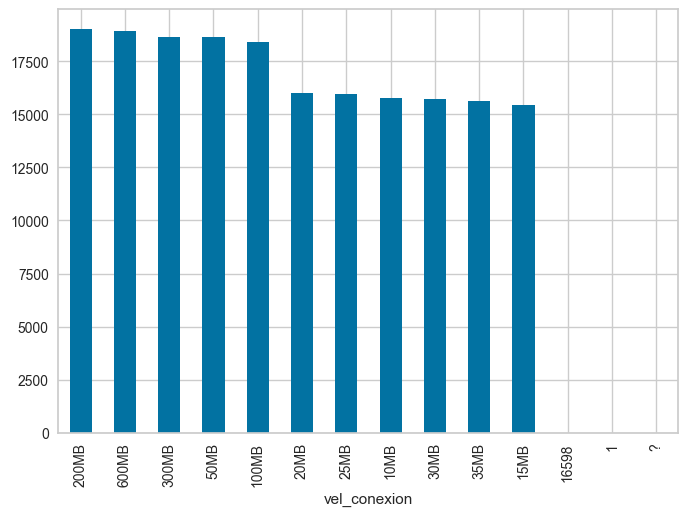

In [29]:
data['vel_conexion'].value_counts().plot(kind='bar')

In [30]:
data[data['vel_conexion'].isnull() | (data['vel_conexion'] == '1') | (data['vel_conexion'] == '?')|(data['vel_conexion'] == '16598')]


,id,edad,facturacion,num_lineas,num_dt,incidencia,num_llamad_ent,num_llamad_sal,mb_datos,seg_llamad_ent,...,conexion,vel_conexion,tv,mes,duracion,month,dia,hora,hora_bin,com_aut
12,13,55,209.365550,3,0.0,NO,118,13,18030,16766,...,FIBRA,16598,tv-familiar,dec,137,August,Thursday,23,Noche,Andalucía
56983,59665,64,258.698493,3,0.0,NO,192,30,938,16230,...,FIBRA,NaN,tv-familiar,dec,3898,April,Tuesday,7,Mañana,Castilla y León
56984,59666,77,258.276588,3,0.0,NO,234,1,14798,11515,...,ADSL,NaN,tv-familiar,dec,2180,January,Friday,13,Tarde,Comunidad Valenciana
56985,59667,20,295.106696,3,0.0,NO,28,94,15396,12113,...,FIBRA,NaN,tv-futbol,dec,2381,June,Sunday,12,Mañana,Castilla y León
70426,73779,26,209.565464,5,1.0,NO,82,29,9667,7184,...,ADSL,1,tv-futbol,dec,7422,September,Saturday,1,Madrugada,Galicia
70528,73889,69,118.515385,2,0.0,NO,74,99,12169,19080,...,FIBRA,?,tv-familiar,dec,6108,April,Thursday,19,Noche,Comunidad Valenciana
95667,215,54,126.570011,5,0.0,NO,114,94,21443,12555,...,ADSL,NaN,tv-futbol,jan,6146,April,Thursday,0,Madrugada,Cantabria
95668,216,60,179.288551,3,0.0,NO,212,74,16951,10913,...,ADSL,NaN,tv-futbol,jan,8887,October,Sunday,10,Mañana,Andalucía
95669,217,52,187.078300,3,0.0,NO,35,20,1146,12066,...,FIBRA,NaN,tv-familiar,jan,3339,December,Thursday,14,Tarde,Andalucía


In [31]:
data['vel_conexion'] = data['vel_conexion'].replace('?', '200MB')
data['vel_conexion'] = data['vel_conexion'].replace('16598', '200MB')
data.vel_conexion.dropna(axis= 0)

0          50MB
1         600MB
2          35MB
3         200MB
4          10MB
          ...  
188173     30MB
188174    200MB
188175     20MB
188176     50MB
188177     25MB
Name: vel_conexion, Length: 188172, dtype: object

In [32]:
data[data['conexion'].isnull()]

,id,edad,facturacion,num_lineas,num_dt,incidencia,num_llamad_ent,num_llamad_sal,mb_datos,seg_llamad_ent,...,conexion,vel_conexion,tv,mes,duracion,month,dia,hora,hora_bin,com_aut
95524,63,28,183.353127,5,0.0,NO,80,26,16659,3649,...,NaN,100MB,tv-familiar,jan,460,October,Saturday,22,Noche,Castilla y León
95525,65,85,369.220953,3,0.0,NO,152,74,304,17449,...,NaN,30MB,tv-total,jan,6338,September,Monday,11,Mañana,País Vasco


In [33]:
data.dropna(subset=["conexion"], inplace=True)


In [34]:
data.dropna(subset=["vel_conexion"], inplace=True)

In [35]:
data.isna().sum()

id                0
edad              0
facturacion       0
num_lineas        0
num_dt            0
incidencia        0
num_llamad_ent    0
num_llamad_sal    0
mb_datos          0
seg_llamad_ent    0
seg_llamad_sal    0
financiacion      0
imp_financ        0
descuentos        0
conexion          0
vel_conexion      0
tv                0
mes               0
duracion          0
month             0
dia               0
hora              0
hora_bin          0
com_aut           0
dtype: int64

In [36]:
data.num_dt.value_counts()

num_dt
0.0    180827
4.0      1891
3.0      1822
1.0      1817
2.0      1813
Name: count, dtype: int64

In [37]:
data["num_dt"] = data["num_dt"].astype(int)
data.num_dt

0         0
1         0
2         0
3         0
4         2
         ..
188173    0
188174    0
188175    0
188176    0
188177    0
Name: num_dt, Length: 188170, dtype: int32

#### Transforming Catgorical Values

In [38]:
binary = ['incidencia', 'financiacion', 'descuentos']

categorical = [col for col in cat_cols if col not in ['incidencia', 'financiacion', 'descuentos', 'mes']]

numerical = ['edad', 'facturacion', 'num_lineas', 'num_dt', 'vel_conexion', 'num_llamad_ent', 
             'num_llamad_sal', 'mb_datos', 'seg_llamad_ent', 'seg_llamad_sal', 'imp_financ', 
             'descuentos', 'duracion', 'hora']


In [39]:
for j in binary:
    data[j] = [0 if x == 'NO' else 1 for x in data[j]]

In [40]:

# Excluir 'incidencia', 'financiacion', 'descuentos' y 'mes' del encoding

# Supongamos que 'categorical' contiene las columnas categóricas
encoder = OrdinalEncoder()

# Guardar los valores originales
original_values = data[categorical].copy()

# Aplicar el encoding solo a las columnas seleccionadas
data[[col + "2" for col in categorical]] = encoder.fit_transform(data[categorical])

# Crear un diccionario para mapear valores originales con codificados
mapping_dict = {}

for i, col in enumerate(categorical):
    mapping_dict[col] = dict(zip(encoder.categories_[i], range(len(encoder.categories_[i]))))

# Convertir el diccionario a DataFrame
mapping_df = pd.DataFrame([
    (col, original, encoded) 
    for col, mapping in mapping_dict.items() 
    for original, encoded in mapping.items()
], columns=["Column", "Original Value", "Encoded Value"])

# Mostrar el DataFrame con la relación entre valores originales y codificados
print(mapping_df)


          Column          Original Value  Encoded Value
0       conexion                    ADSL              0
1       conexion                   FIBRA              1
2   vel_conexion                       1              0
3   vel_conexion                   100MB              1
4   vel_conexion                    10MB              2
5   vel_conexion                    15MB              3
6   vel_conexion                   200MB              4
7   vel_conexion                    20MB              5
8   vel_conexion                    25MB              6
9   vel_conexion                   300MB              7
10  vel_conexion                    30MB              8
11  vel_conexion                    35MB              9
12  vel_conexion                    50MB             10
13  vel_conexion                   600MB             11
14            tv             tv-familiar              0
15            tv               tv-futbol              1
16            tv                tv-total        

In [41]:
data.to_csv('test2.csv',index= False)

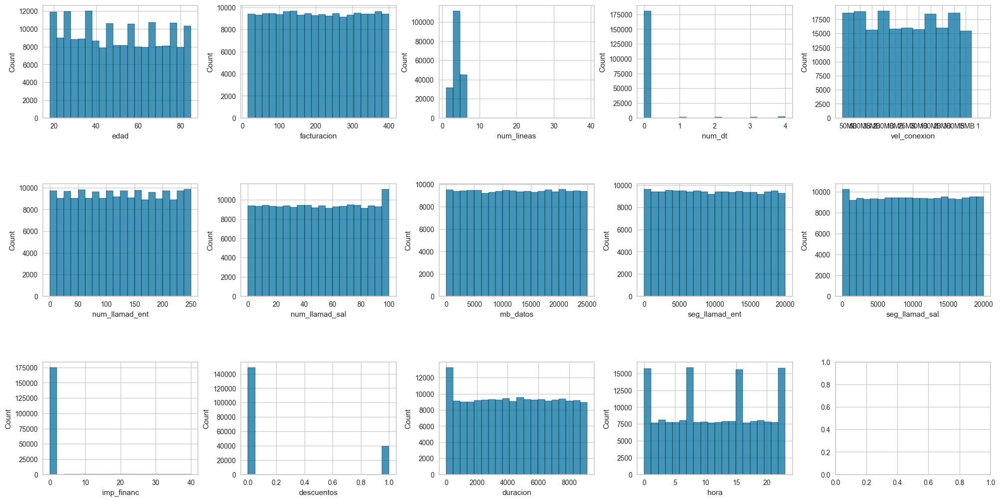

In [42]:
## Variables numéricas
def plot_distributions(df):
    fig, axs = plt.subplots(ncols=5, nrows=3, figsize=(20, 10))
    axs = axs.flatten()
    index = 0
    for k, v in df.items():
        if k == 'permanencia':
            sns.countplot(v, ax=axs[index])
        else:
            sns.histplot(v, bins=20, ax=axs[index])
        index += 1
    plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=5.0)
    plt.show()

plot_distributions(data[numerical])

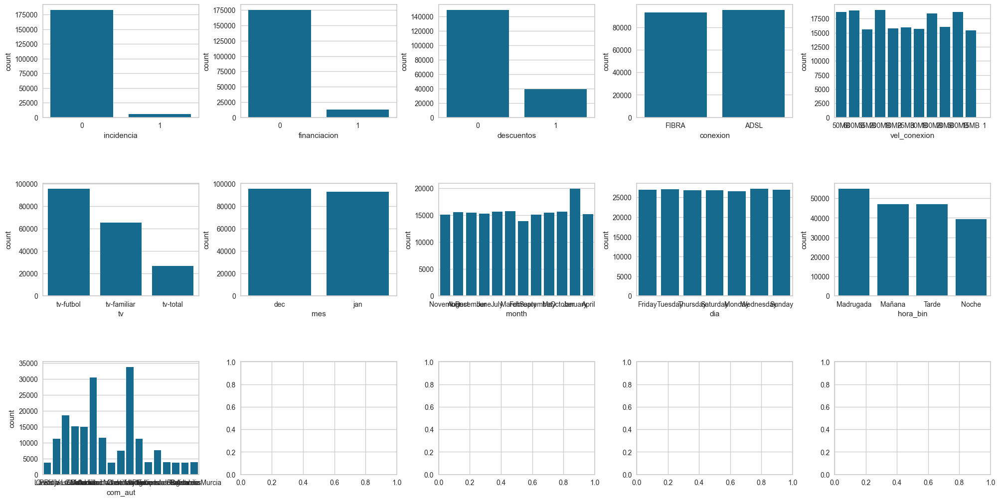

In [43]:
# Variables categóricas
fig, axs = plt.subplots(ncols=5, nrows=3, figsize=(20, 10))
axs = axs.flatten() # 

index = 0
for k,v in data[cat_cols].items(): 
    sns.countplot(data=data, x=v, ax=axs[index])
    index += 1

plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=5.0)

In [44]:
list_correlacion = ['edad', 'facturacion', 'num_lineas', 'num_dt', 'incidencia',
       'num_llamad_ent', 'num_llamad_sal', 'mb_datos', 'seg_llamad_ent',
       'seg_llamad_sal', 'financiacion', 'imp_financ', 'descuentos',
       'vel_conexion','duracion', 'month', 'dia', 'hora', 'hora_bin']

edad


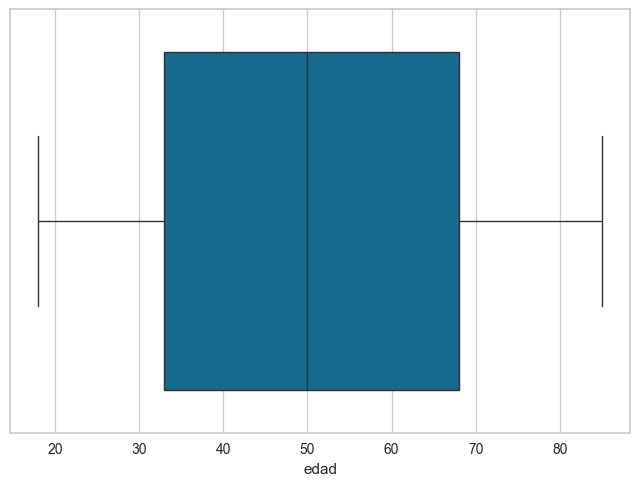

facturacion


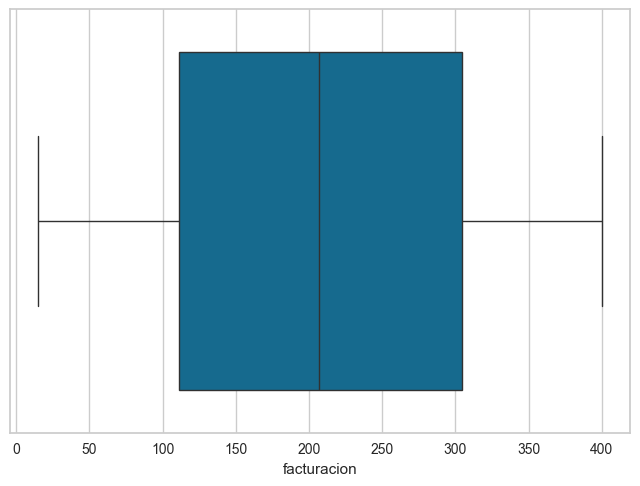

num_lineas


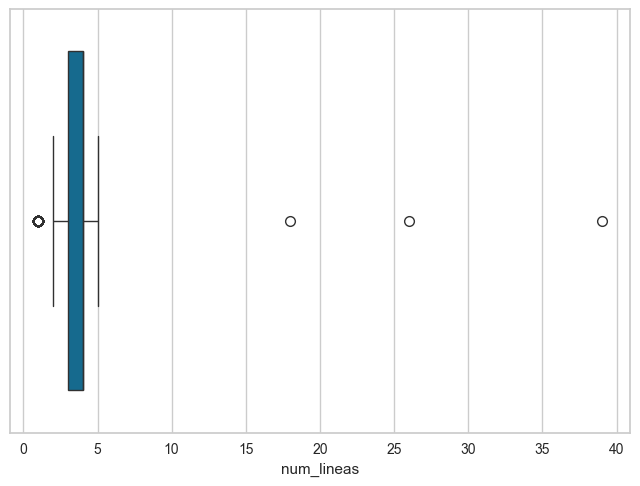

num_dt


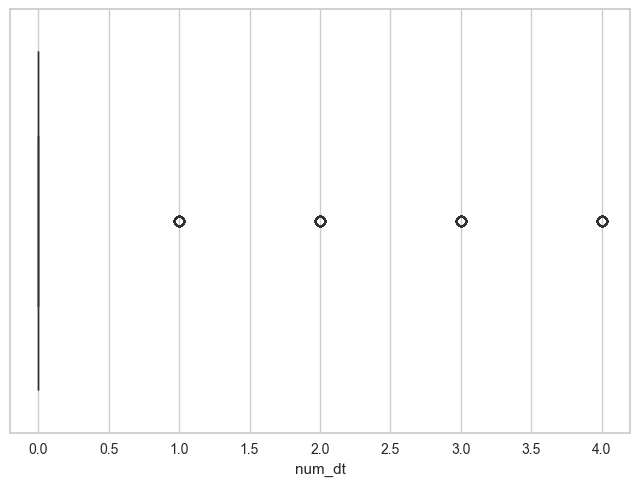

incidencia


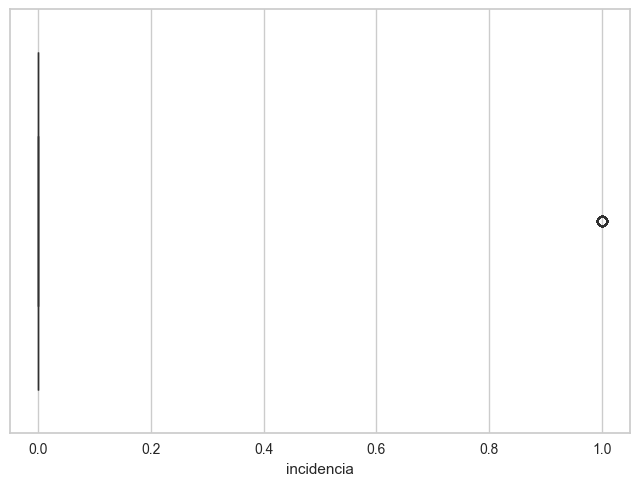

num_llamad_ent


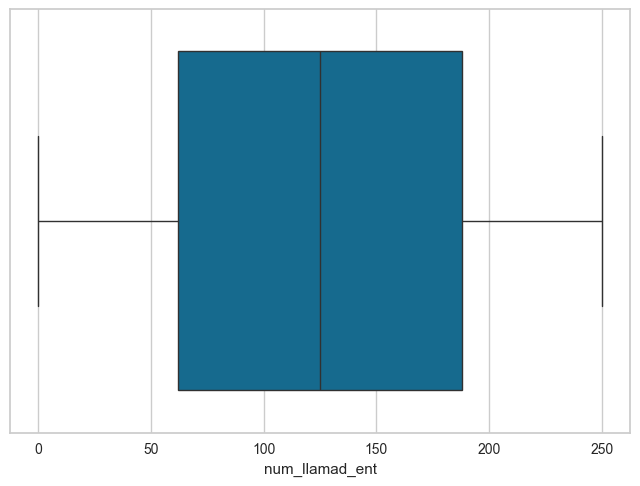

num_llamad_sal


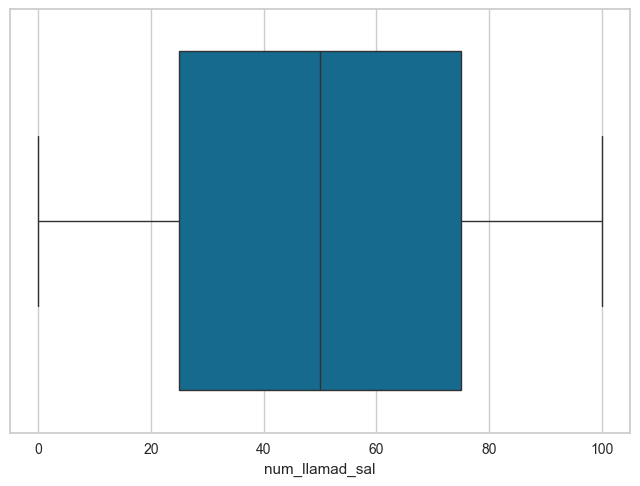

mb_datos


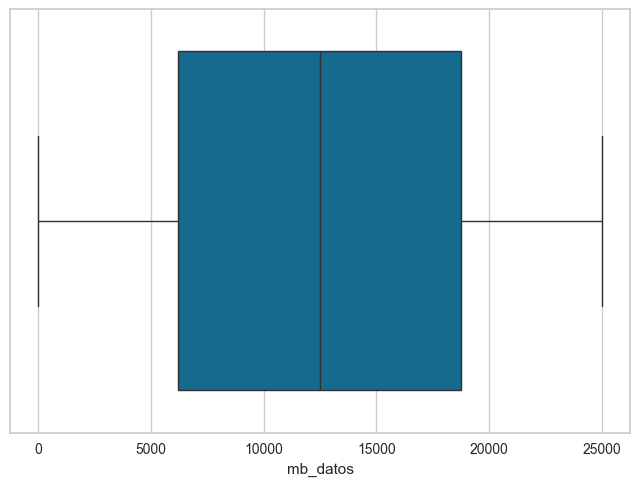

seg_llamad_ent


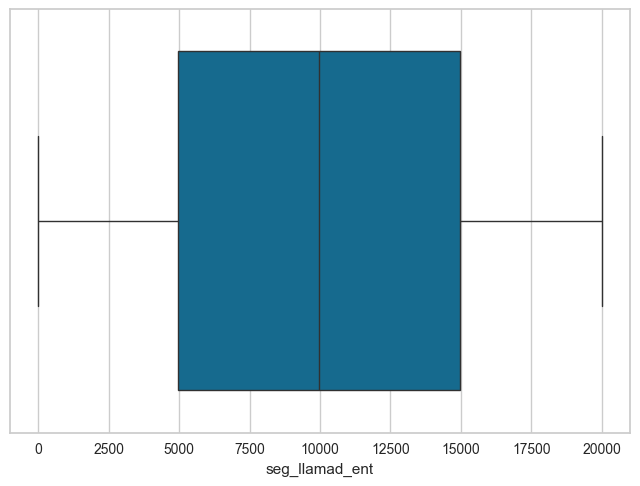

seg_llamad_sal


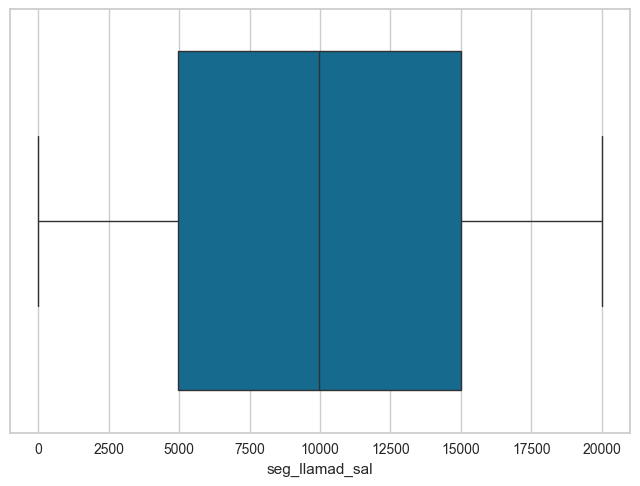

financiacion


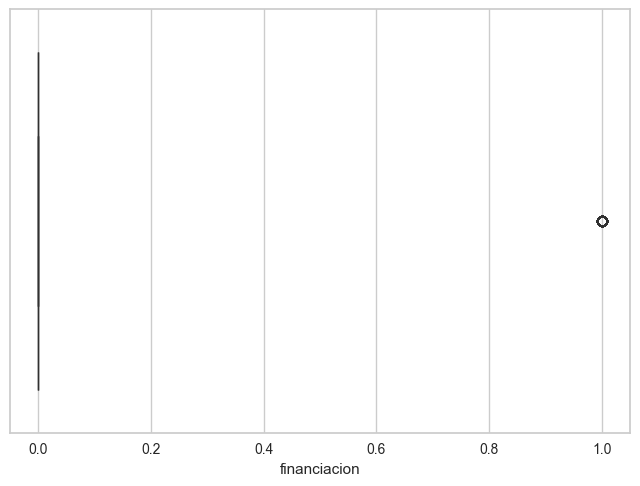

imp_financ


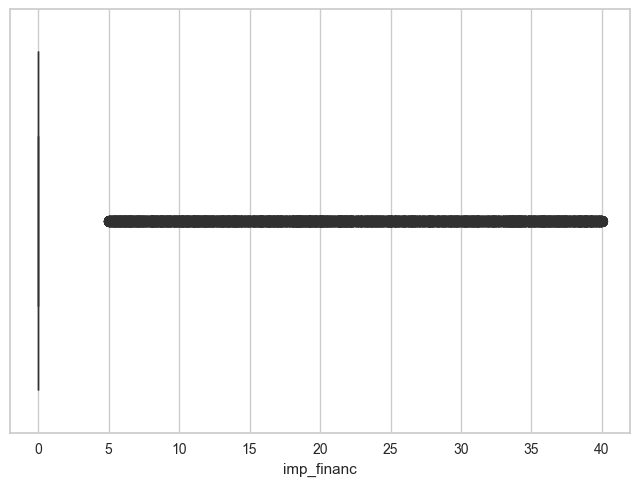

descuentos


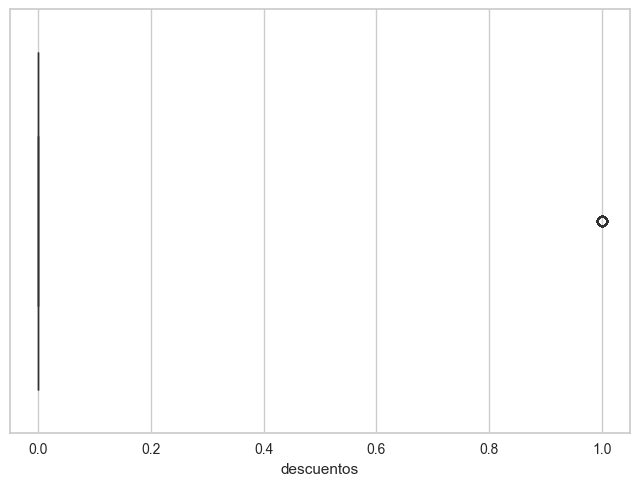

vel_conexion


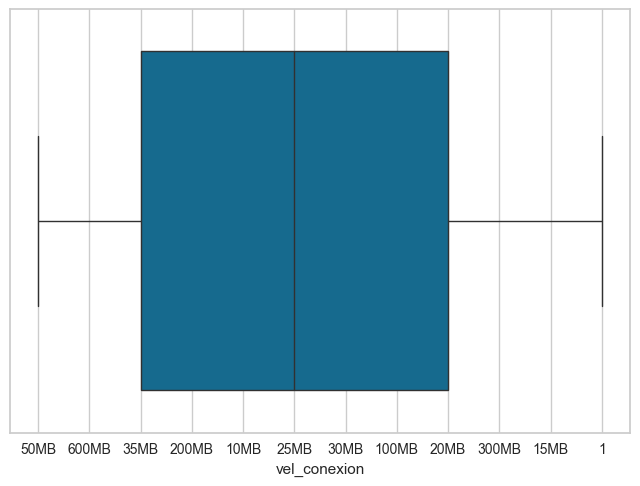

duracion


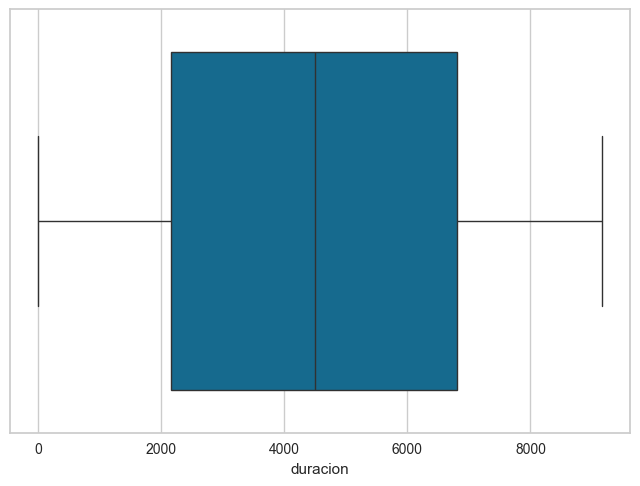

month


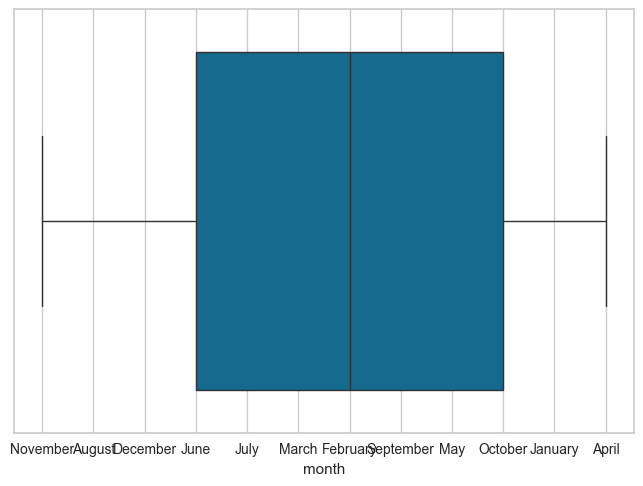

dia


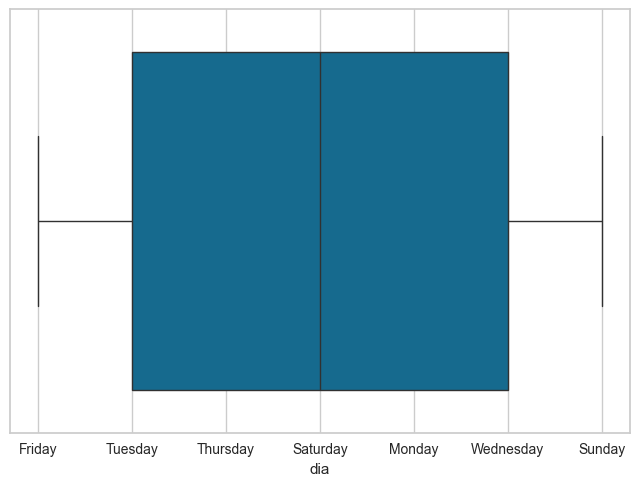

hora


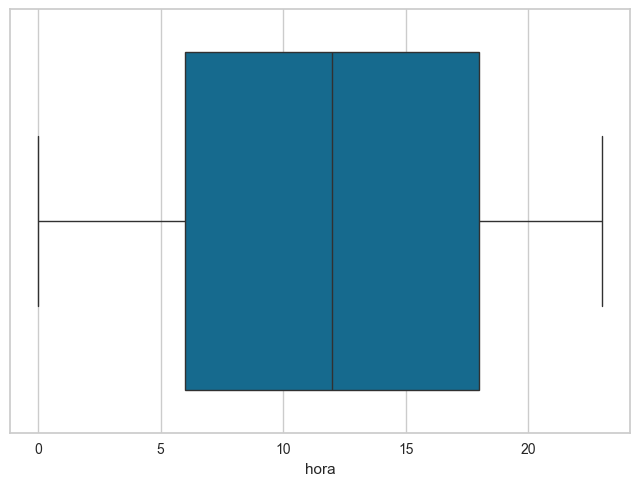

hora_bin


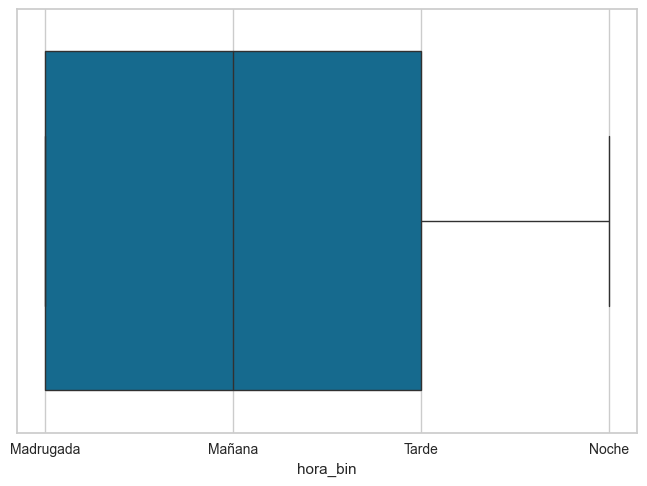

In [45]:
for i in list_correlacion:
    sns.boxplot(x=data[i])
    print(i)
    plt.show()

In [46]:
threshold = 3
z = np.abs(stats.zscore(data['num_lineas']))
print(z)
print(np.where(z > 3))

## Hay 3 valores que están fuera del rango. Podemos eliminar esas filas

#data.drop([2580,8657,36987], axis=0,inplace=True)

0         1.320424
1         0.513158
2         0.403633
3         0.403633
4         1.429949
            ...   
188173    0.513158
188174    1.320424
188175    0.403633
188176    1.429949
188177    0.403633
Name: num_lineas, Length: 188170, dtype: float64
(array([ 2580,  8657, 36987], dtype=int64),)


In [47]:
data.drop(categorical, axis=1, inplace=True)


In [48]:
data.columns

Index(['id', 'edad', 'facturacion', 'num_lineas', 'num_dt', 'incidencia',
       'num_llamad_ent', 'num_llamad_sal', 'mb_datos', 'seg_llamad_ent',
       'seg_llamad_sal', 'financiacion', 'imp_financ', 'descuentos', 'mes',
       'duracion', 'hora', 'conexion2', 'vel_conexion2', 'tv2', 'month2',
       'dia2', 'hora_bin2', 'com_aut2'],
      dtype='object')

In [49]:
df_dic = pd.merge(data[data['mes']=='dec'], churn, on='id', how='left')

In [50]:
df_dic.drop(['mes'], axis=1, inplace=True)
df_dic.set_index('id', inplace=True)

In [51]:
df_dic.to_csv('dfdic.csv',index= False)

In [52]:
corr = abs(df_dic.corr())
correlation = corr[['churn']].sort_values(by = 'churn',ascending = False)

correlation

,churn
churn,1.000000
num_dt,0.312794
edad,0.296841
incidencia,0.277407
descuentos,0.141448
financiacion,0.074600
imp_financ,0.067628
conexion2,0.051475
vel_conexion2,0.006527
num_llamad_ent,0.006133


## 5. Model Training

We train different machine learning models and tune their hyperparameters.

In [53]:
X_train, X_test, y_train, y_test = train_test_split(df_dic.drop('churn',axis=1),
                                                    df_dic.churn,
                                                    test_size=0.2,
                                                    random_state=1234,
                                                    stratify = df_dic.churn)

In [54]:
print(f"X_train shape: {X_train.shape}")
print(f"X_test shape: {X_test.shape}")
print(f"y_train shape: {y_train.shape}")
print(f"y_test shape: {y_test.shape}")


X_train shape: (76371, 22)
X_test shape: (19093, 22)
y_train shape: (76371,)
y_test shape: (19093,)


In [55]:
def plot_target_vs_features(var, target, df):
    proporcion = pd.DataFrame()
    proporcion['%'] = df[target].groupby(df[var]).mean() * 100
    proporcion['Conteo'] = df[target].groupby(df[var]).count()
    proporcion = proporcion.round(3)
    proporcion_filtered = proporcion[(proporcion['%'] > 0) & (proporcion['Conteo'] > 10)]
    
    if len(proporcion_filtered) < 100 and len(proporcion_filtered) > 1:
        fig = px.bar(proporcion_filtered, x=proporcion_filtered.index, y='Conteo', title=f'Distribución de {var}', labels={'x': var, 'Conteo': 'Cantidad'}, template='plotly_white')
        fig.add_trace(go.Scatter(x=proporcion_filtered.index, y=proporcion_filtered['%'], mode='lines+markers', name='%', yaxis='y2', line=dict(color='green')))
        
        fig.update_layout(
            yaxis2=dict(title='%', overlaying='y', side='right')
        )
    elif len(proporcion_filtered) >= 100:
        df_filtered = df[[var, target]].dropna()
        df_filtered['bin'] = pd.qcut(df_filtered[var], q=20, duplicates='drop')
        bin_means = df_filtered.groupby('bin')[target].mean() * 100
        bin_counts = df_filtered.groupby('bin')[target].count()
        
        fig = go.Figure()
        fig.add_trace(go.Bar(x=bin_means.index.astype(str), y=bin_counts, name='Conteo', yaxis='y', marker_color='blue'))
        fig.add_trace(go.Scatter(x=bin_means.index.astype(str), y=bin_means, mode='lines+markers', name='%', yaxis='y2', line=dict(color='green')))
        
        fig.update_layout(
            title=f'Relación entre {var} y {target}',
            xaxis_title=f'Binned {var}',
            yaxis=dict(title='Conteo'),
            yaxis2=dict(title='%', overlaying='y', side='right'),
            template='plotly_white'
        )
    else:
        proporcion_filtered.reset_index(inplace=True)
        fig = px.scatter(proporcion_filtered, x=var, y='%', trendline='ols', title=f'Relación entre {var} y % Depósitos', template='plotly_white')
    
    fig.show()

In [56]:
for i in df_dic.columns:
    plot_target_vs_features (i, 'churn', df_dic)

In [57]:
mapping_df.dropna(axis=0, inplace=True)
mapping_df.set_index('Column', inplace=True)

In [58]:
mapping_df

,Original Value,Encoded Value
Column,,
conexion,ADSL,0
conexion,FIBRA,1
vel_conexion,1,0
vel_conexion,100MB,1
vel_conexion,10MB,2
vel_conexion,15MB,3
vel_conexion,200MB,4
vel_conexion,20MB,5
vel_conexion,25MB,6


In [59]:
def saca_metricas(y1, y2):
    print('Matriz de Confusión')
    print(confusion_matrix(y1, y2))
    print('Accuracy:', accuracy_score(y1, y2))
    print('Precision:', precision_score(y1, y2))
    print('Recall:', recall_score(y1, y2))
    print('F1 Score:', f1_score(y1, y2))
    
    # Cálculo de la curva ROC y AUC
    false_positive_rate, recall, _ = roc_curve(y1, y2)
    roc_auc = auc(false_positive_rate, recall)
    print('AUC:', roc_auc)
    
    # Crear gráfico interactivo con Plotly
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=false_positive_rate, y=recall, mode='lines', name='Curva ROC', line=dict(color='blue')))
    fig.add_trace(go.Scatter(x=[0, 1], y=[0, 1], mode='lines', name='Línea base', line=dict(color='red', dash='dash')))
    
    fig.update_layout(
        title=f'Curva ROC (AUC = {roc_auc:.2f})',
        xaxis_title='False Positive Rate',
        yaxis_title='Recall',
        template='plotly_white'
    )
    
    fig.show()

In [60]:

mlflow.set_tracking_uri("http://localhost:5000")


In [61]:
!mlflow ui

^C


In [62]:
mlflow.set_experiment("ejercicio_churn")

<Experiment: artifact_location='file:///c:/Users/alros/Documents/Master%20UCM%20Modulos%20Documentacion/8.%20Machine%20Learning/Semana%203%20y%204/2.ejercicio_churn/Ejercicio%20Churn/mlruns/574644383316800476', creation_time=1741294625702, experiment_id='574644383316800476', last_update_time=1741294625702, lifecycle_stage='active', name='ejercicio_churn', tags={}>

In [63]:
with mlflow.start_run(run_name='decission_tree'):

    # Modelo y predicciones:
    modelo = DecisionTreeClassifier(criterion="gini").fit(X_train, y_train)
    y_pred = modelo.predict(X_test)

    # Métricas:
    saca_metricas(y_test, y_pred)

    # predict_proba returns [prob_negative, prob_positive], so slice the output with [:, 1]
    accuracy = accuracy_score(y_test, y_pred)
    false_positive_rate, recall, thresholds = roc_curve(y_test, y_pred)
    roc_auc = auc(false_positive_rate, recall)
   
    # Use the area under the ROC curve as a metric.
    mlflow.log_metric('accuracy', accuracy)
    mlflow.log_metric('roc_auc', roc_auc)
    # log model
    mlflow.sklearn.log_model(modelo,'tree_ntic')
    # save model
    mlflow.sklearn.save_model(modelo, 'tree.pkl',
                              serialization_format=mlflow.sklearn.SERIALIZATION_FORMAT_PICKLE)

Matriz de Confusión
[[17043   633]
 [  611   806]]
Accuracy: 0.9348452312365788
Precision: 0.5601111883252259
Recall: 0.5688073394495413
F1 Score: 0.5644257703081232
AUC: 0.7664980349657754


2025/03/07 11:33:45 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


🏃 View run decission_tree at: http://localhost:5000/#/experiments/574644383316800476/runs/b8f9cbcfcfad484e82a8139a37a48a07
🧪 View experiment at: http://localhost:5000/#/experiments/574644383316800476


In [64]:
with mlflow.start_run(run_name='random_forest'):

    modelo = RandomForestClassifier().fit(X_train, y_train)
    y_pred = modelo.predict(X_test)

    saca_metricas(y_test, y_pred)

    # predict_proba returns [prob_negative, prob_positive], so slice the output with [:, 1]
    accuracy = accuracy_score(y_test, y_pred)
    false_positive_rate, recall, thresholds = roc_curve(y_test, y_pred)
    roc_auc = auc(false_positive_rate, recall)
   
    # Use the area under the ROC curve as a metric.
    mlflow.log_metric('accuracy', accuracy)
    mlflow.log_metric('roc_auc', roc_auc)
    # log model
    mlflow.sklearn.log_model(modelo,'rf_ntic')
    # save model
    mlflow.sklearn.save_model(modelo, 'rf.pkl',
                              serialization_format=mlflow.sklearn.SERIALIZATION_FORMAT_PICKLE)

Matriz de Confusión
[[17595    81]
 [  641   776]]
Accuracy: 0.9621850940135128
Precision: 0.9054842473745625
Recall: 0.547635850388144
F1 Score: 0.6824978012313104
AUC: 0.7715266828315465


2025/03/07 11:34:04 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


🏃 View run random_forest at: http://localhost:5000/#/experiments/574644383316800476/runs/bc4ca9b24a9441fca49fbbf43eead216
🧪 View experiment at: http://localhost:5000/#/experiments/574644383316800476


In [65]:
with mlflow.start_run(run_name='logistic'):

    modelo = LogisticRegression(max_iter=10000).fit(X_train, y_train)
    y_pred = modelo.predict(X_test)

    saca_metricas(y_test, y_pred)

    # predict_proba returns [prob_negative, prob_positive], so slice the output with [:, 1]
    accuracy = accuracy_score(y_test, y_pred)
    false_positive_rate, recall, thresholds = roc_curve(y_test, y_pred)
    roc_auc = auc(false_positive_rate, recall)
   
    # Use the area under the ROC curve as a metric.
    mlflow.log_metric('accuracy', accuracy)
    mlflow.log_metric('roc_auc', roc_auc)
    # log model
    mlflow.sklearn.log_model(modelo,'logistc_ntic')
    # save model
    mlflow.sklearn.save_model(modelo, 'logistic.pkl',
                              serialization_format=mlflow.sklearn.SERIALIZATION_FORMAT_PICKLE)

Matriz de Confusión
[[17573   103]
 [  866   551]]
Accuracy: 0.9492484156497145
Precision: 0.8425076452599388
Recall: 0.3888496824276641
F1 Score: 0.5321100917431193
AUC: 0.6915112861108675


2025/03/07 11:34:55 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


🏃 View run logistic at: http://localhost:5000/#/experiments/574644383316800476/runs/79be8ae60aff496abe12037f8f9666c4
🧪 View experiment at: http://localhost:5000/#/experiments/574644383316800476


In [ ]:
modelo = RandomForestClassifier().fit(X_train, y_train)
y_pred = modelo.predict(X_test)

In [67]:
cv = cross_val_score(
    modelo,
    X_train, 
    y_train,
    scoring = "roc_auc",
    cv = 5
)
print(cv)
print("CV ROC:", cv.mean(), np.std(cv))

[0.96577484 0.96043317 0.96336362 0.96543849 0.96479654]
CV ROC: 0.9639613332058994 0.001948003548081128


In [68]:
pkl_filename = "modelo1.pkl"
with open(pkl_filename, 'wb') as file:
    pickle.dump(modelo, file)

# Load from file
with open(pkl_filename, 'rb') as file:
    pickle_model = pickle.load(file)

In [69]:
df_ene = data[data['mes']=='jan']

In [70]:
df_ene.drop('mes', axis=1, inplace=True)
df_ene.set_index('id', inplace=True)

In [71]:
df_ene['score'] = modelo.predict_proba(df_ene)[:,1]

In [72]:
df_ene.sort_values('score', ascending=False)

,edad,facturacion,num_lineas,num_dt,incidencia,num_llamad_ent,num_llamad_sal,mb_datos,seg_llamad_ent,seg_llamad_sal,...,duracion,hora,conexion2,vel_conexion2,tv2,month2,dia2,hora_bin2,com_aut2,score
id,,,,,,,,,,,,,,,,,,,,,
87262,30,347.904448,3,2,0,154,90,10894,15777,5150,...,4470,2,0.0,3.0,1.0,9.0,3.0,0.0,8.0,0.96
87368,36,260.118525,4,4,0,243,72,683,9985,2996,...,1722,13,0.0,5.0,1.0,8.0,4.0,3.0,5.0,0.95
55967,26,305.403825,4,0,1,133,23,23183,2798,16341,...,6772,21,1.0,7.0,1.0,5.0,1.0,2.0,4.0,0.95
68989,26,102.289337,2,2,0,28,30,10645,10088,14293,...,950,15,1.0,4.0,1.0,6.0,2.0,3.0,4.0,0.93
44561,24,25.390072,1,2,0,90,80,13909,13690,11255,...,5220,5,1.0,4.0,1.0,10.0,2.0,0.0,3.0,0.93
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41088,23,81.610861,4,0,0,131,74,17080,4513,15667,...,3620,11,0.0,3.0,1.0,7.0,6.0,1.0,4.0,0.00
41091,65,305.190225,5,0,0,199,3,4201,448,15806,...,6657,21,1.0,4.0,2.0,9.0,4.0,2.0,4.0,0.00
41092,61,95.431501,2,0,0,85,71,19567,11951,796,...,803,8,0.0,8.0,0.0,9.0,2.0,1.0,4.0,0.00
